In [1]:
import cv2
import datetime
import numpy as np
from PIL import Image
from pathlib import Path
import matplotlib.pyplot as plt
import sys
# Add the project root directory to the Python path
sys.path.append('../')

from src.utils.config import MODEL_DIR, DATA_DIR
from src.utils import detector_utils as detector_utils
from src.utils.bonding_box_utils import calculate_iou, calculate_distance

Load Yolo Model

In [2]:
yolo_model = MODEL_DIR / "yolov3.weights"
yolo_config = MODEL_DIR / "yolov3.cfg"
labels_path = MODEL_DIR / "yolov3.names"

LABELS = open(labels_path).read().strip().split("\n")

np.random.seed(42)
COLORS = np.random.randint(0, 255, size=(len(LABELS), 3),
    dtype="uint8")

print("====== loading YOLO model ====== ")
net = cv2.dnn.readNetFromDarknet(yolo_config.as_posix(), yolo_model.as_posix())

# determine only the *output* layer names that we need from YOLO
ln = net.getLayerNames()
ln = [ln[i[0] - 1] for i in net.getUnconnectedOutLayers()]
print("+++++++++++++ YOLO model loaded +++++++++++++")

====== loading YOLO model ====== 
+++++++++++++ YOLO model loaded +++++++++++++


Load Hand Detection Model

In [3]:
detection_graph, sess = detector_utils.load_inference_graph()
score_thresh=0.2
num_hands_detect = 2

====== loading HAND frozen graph into memory ======
+++++++++++++ Hand Inference graph loaded +++++++++++++


Load Hand Classification Model

In [4]:
from keras.models import load_model
IMAGE_WIDTH = 224
IMAGE_HEIGHT = 224
# Load Model
print("====== loading hand classification model ====== ")
model = load_model(MODEL_DIR / 'hand_classification.h5')
print("+++++++++++++ hand classification model loaded +++++++++++++")

====== loading hand classification model ====== 
+++++++++++++ hand classification model loaded +++++++++++++


In [5]:
def preprocess_frame(frame):
    """
    Preprocesses a single video frame to match the model's input requirements.
    """
    # Resize the frame to the target dimensions
    img = cv2.resize(frame, (IMAGE_WIDTH, IMAGE_HEIGHT))
    img = img / 255.0

    # --- IMPORTANT: Add a batch dimension ---
    # The shape should go from (height, width, channels) to (1, height, width, channels).
    img = np.expand_dims(img, axis=0)

    return img

In [6]:
def crop_with_padding(image, box):
    """
    Crops an image based on a bounding box, adding padding equal to the
    size of the original crop, effectively doubling its dimensions.

    Args:
        image (np.array): The input image loaded by OpenCV.
        box (tuple): A tuple containing the bounding box coordinates
                     in the format (left, right, top, bottom).

    Returns:
        np.array: The cropped image with padding.
    """
    # Get the dimensions of the full image
    img_h, img_w, _ = image.shape
    
    # Unpack the bounding box coordinates
    left, right, top, bottom = box
    
    # Calculate the width and height of the original crop
    width = right - left
    height = bottom - top
    
    # Calculate the padding to add to each side (half of the original dimensions)
    pad_x = 0
    pad_y = 0
    
    # Calculate the new coordinates for the padded crop
    new_left = left - pad_x
    new_right = right + pad_x
    new_top = top - pad_y
    new_bottom = bottom + pad_y
    
    # --- IMPORTANT: Clamp coordinates to the image boundaries ---
    # This prevents errors if the padded box goes outside the image
    final_left = max(0, new_left)
    final_right = min(img_w, new_right)
    final_top = max(0, new_top)
    final_bottom = min(img_h, new_bottom)
    
    # Crop the image using the final, clamped coordinates
    padded_crop = image[final_top:final_bottom, final_left:final_right]
    
    return padded_crop

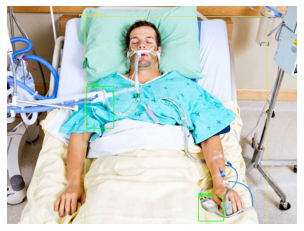

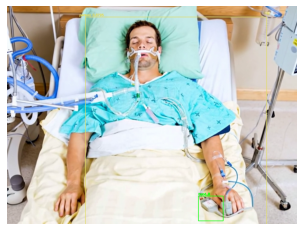

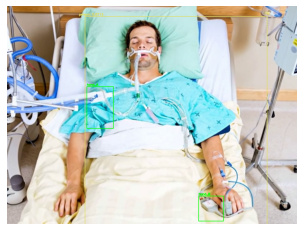

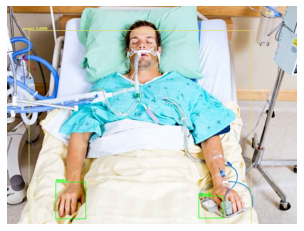

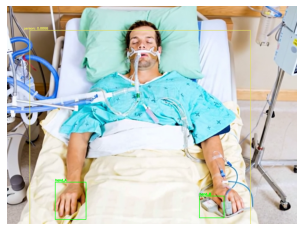

...

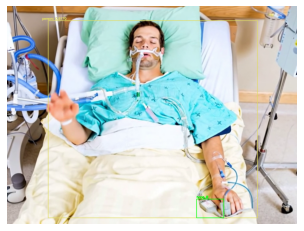

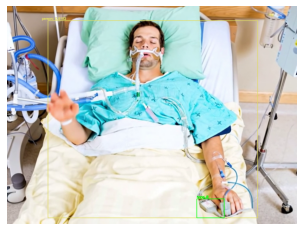

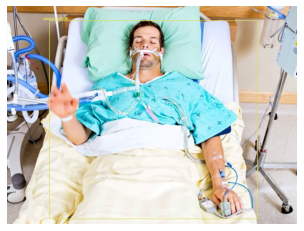

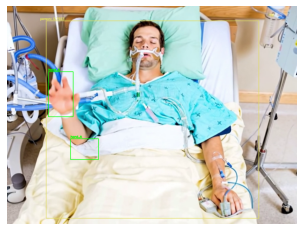

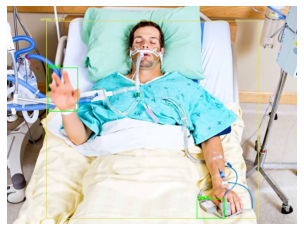

ABNORMAL BEHAVIOUR - CALL THE DOCTOR 












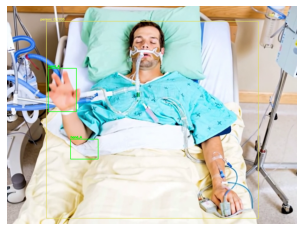

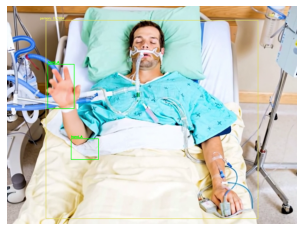

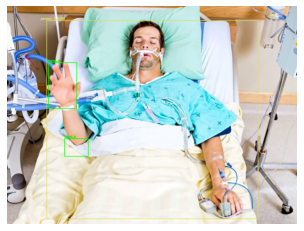

More than two human localized
ABNORMAL BEHAVIOUR - CALL THE DOCTOR 










ABNORMAL BEHAVIOUR - CALL THE DOCTOR 












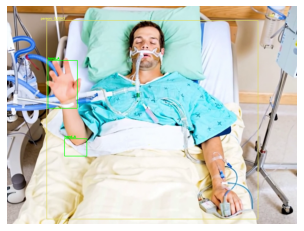

More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than two human localized
More than 

In [12]:
# Manage Hands A and B

score_thresh=0.09
num_hands_detect = 2
input_video = DATA_DIR / "activity_monitoring.mp4"
vidcapture = cv2.VideoCapture(input_video.as_posix())
original_width = int(vidcapture.get(3))
original_height = int(vidcapture.get(4))
resize_width = 1280
resize_height = 720
hand_A, hand_B = None, None
hand_A_defect, hand_B_defect = 0, 0
lable = "hand_A"
while 1:
    success, image = vidcapture.read()
    if not success:
        break

    # 1. HUMAN LOCALIZATION

    blob = cv2.dnn.blobFromImage(image, 1 / 255.0, (416, 416), swapRB=True, crop=False)
    # pass of the YOLO object detector, giving us our bounding boxes and
    net.setInput(blob)
    #run net
    layerOutputs = net.forward(ln)

    boxes = []
    confidences = []
    classIDs = []
    number = 0
    # output are grids ( 13 * 13 * 3 ) in (13 * 13 * 3 * yolo layers)
    for output in layerOutputs:

        #detections are outputs of each anchor for each grid (85) in (85 * 3)
        for detection in output:

            # extract the class ID and confidence (i.e., probability) of
            # the current object detection
            scores = detection[5:]
            classID = np.argmax(scores)
            confidence = scores[classID]
            if confidence > 0.5:
                box = detection[0:4] * np.array([original_width, original_height, original_width, original_height])
                (centerX, centerY, width, height) = box.astype("int")

                x = int(centerX - (width / 2))
                y = int(centerY - (height / 2))

                boxes.append([x, y, int(width), int(height)])
                confidences.append(float(confidence))
                classIDs.append(classID)

    idxs = cv2.dnn.NMSBoxes(boxes, confidences, 0.5, 0.3)
    if len(idxs) == 0:
        logging.info("No Human localized")
        continue

    for i in idxs.flatten():
        (x, y) = (boxes[i][0], boxes[i][1])
        (w, h) = (boxes[i][2], boxes[i][3])

        color = [int(c) for c in COLORS[classIDs[i]]]
        if LABELS[classIDs[i]] == 'person':
            number += 1
            person_x = x + 30
            person_y = y
            person_w = w
            person_h = h + 30
            cv2.rectangle(image, (person_x, person_y), (person_x + person_w, person_y + person_h), color, 2)
            text = "{}: {:.4f}".format(LABELS[classIDs[i]], confidences[i])
            cv2.putText(image, text, (x, y - 5), cv2.FONT_HERSHEY_SIMPLEX,
                            0.5, color, 2)
    if number != 1:
        print("More than two human localized")
        continue
    
    human_localized = image[person_y:person_y+person_h, person_x:person_x+person_w]
    # Get the dimensions of the cropped person before resizing
    (person_h_orig, person_w_orig, _) = human_localized.shape
    hand_width_factor = person_w_orig / resize_width
    hand_height_factor = person_h_orig / resize_height

    # 2. HAND DETECTION
    hand_detection = cv2.resize(human_localized, (resize_width, resize_height))
    boxes = []
    scores = []
    boxes, scores = detector_utils.detect_objects(hand_detection, detection_graph, sess)
    # draw bounding boxes on frame (left, right, top, bottom)
    hands_detected_boxes = detector_utils.draw_box_on_image(num_hands_detect, score_thresh,
                                             scores, boxes, resize_width, resize_height,
                                             hand_detection)
    for hand_detected_box in hands_detected_boxes:
        scaled_left = int(hand_detected_box[0] * hand_width_factor)
        scaled_right = int(hand_detected_box[1] * hand_width_factor)
        scaled_top = int(hand_detected_box[2] * hand_height_factor)
        scaled_bottom = int(hand_detected_box[3] * hand_height_factor)
        final_left = scaled_left + person_x
        final_right = scaled_right + person_x
        final_top = scaled_top + person_y
        final_bottom = scaled_bottom + person_y
        cv2.rectangle(image, (final_left, final_top), (final_right, final_bottom), (0, 255, 0), 2)
        
        # Hand tracking
        if hand_A == None:
            hand_A = hand_detected_box
        
        if hand_B == None and calculate_iou(hand_A, hand_detected_box) < 0.5:
            hand_B = hand_detected_box
            
        hand_A_distance = calculate_distance(hand_A, hand_detected_box)
        hand_B_distance = calculate_distance(hand_B, hand_detected_box)
        
        if hand_A_distance < hand_B_distance:
            hand_A = hand_detected_box
            label = "hand_A"
        else:
            hand_B = hand_detected_box
            label = "hand_B"
    
        cv2.putText(image, label, (final_left, final_top - 5), cv2.FONT_HERSHEY_SIMPLEX, 0.5, (0, 255, 0), 2)

            
        # Hand Classification
        hand = crop_with_padding(hand_detection, hand_detected_box)
        hand_resized = cv2.resize(hand, (224, 224), interpolation=cv2.INTER_AREA)
        preprocessed_frame = preprocess_frame(hand_resized)
        prediction = model.predict(preprocessed_frame)
        score = prediction[0][0]
        if score < 0.3:
            if label == "hand_A":
                hand_A_defect += 1
            else:
                hand_B_defect += 1
        elif score > 0.7:
            if label == "hand_A":
                hand_A_defect = 0
            else:
                hand_B_defect = 0
        else:
            pass
        
        # Final decision
        if hand_A_defect > 2 or hand_B_defect > 2:
            print("ABNORMAL BEHAVIOUR - CALL THE DOCTOR \n\n\n\n\n\n\n\n\n\n")
            cv2.imshow("ABNORMAL",image)
            cv2.waitKey(0)

    image_rgb = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)
    plt.imshow(image_rgb)
    plt.axis('off')  # Optional: Hides the axis ticks and labels
    plt.show()

In [13]:
cv2.destroyAllWindows()